# 🐻‍❄️ 투빅스 정규세션 4주차 1교시 Image Generative AI 코드 과제 🐻‍❄️



## 과제 목적
이번 과제에서는 이미지 생성 모델의 세 가지 큰 축인 **VAE**, **GAN**, **Diffusion**의 핵심 구현을 직접 코드로 뜯어보고, 마지막으로 Hugging Face의 사전학습 Diffusion 모델을 API처럼 불러와 실습해봅니다.
끝에는 직접 자기가 원하는 모델을 선택 후 써보는 경험까지 고안해보며 활용 능력까지 얻을 수 있도록 해봅니다.




## 제출물

1. 빈칸을 모두 채우고 **전부 실행한** 이 노트북 (출력 포함)
2. 기술블로그 '과제 복습' 섹션 — 마지막에 모델 활용한 [hugging face] question 4 부분만




- **VAE (Variational AutoEncoder)**: 입력 데이터를 확률적인 잠재 공간(latent space)으로 압축한 뒤, 그 분포에서 샘플링하여 새로운 데이터를 생성하는 모델
- **GAN (Generative Adversarial Network)**: Generator(위조지폐범)와 Discriminator(경찰)가 서로 경쟁하며 학습하는 모델
- **Diffusion Model**: 이미지에 점진적으로 노이즈를 주입(Forward process)한 뒤, 그 노이즈를 단계적으로 제거(Reverse process)하도록 학습하여 무작위 노이즈로부터 이미지를 생성하는 모델

Part 1~3에서는 세 모델을 MNIST로 직접 구현/학습하며 원리를 비교하고, Part 4에서는 Hugging Face `diffusers` 라이브러리로 실제 학습된 대형 Diffusion 모델을 실습합니다.


### **모듈 임포트 및 디바이스 설정**

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import torch.nn.functional as F
import numpy as np

device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print(device)


mps


### **데이터셋 준비 (MNIST dataset)**

In [2]:
batch_size = 128
epochs = 15

transform = transforms.Compose([
    transforms.ToTensor()
])

dataset = torchvision.datasets.MNIST(
    root='./data',
    train=True,
    download=True,
    transform=transform
)

# train / val split
train_size = int(0.9 * len(dataset))
val_size = len(dataset) - train_size

train_dataset, val_dataset = torch.utils.data.random_split(
    dataset,
    [train_size, val_size]
)

train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True
)

val_loader = torch.utils.data.DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False
)


## **Part 1. VAE (Variational AutoEncoder) 모델 정의 및 학습**

* Encoder: 입력 데이터 x를 받아 잠재 공간(Latent Space)의 파라미터를 추출
  * 고차원의 입력데이터를 저차원의 평균과 로그 분산으로 변환
    * 💡 빈칸 채우기 hint) `self.fc1`을 거쳐 특징을 추출한 뒤, 두 개의 서로 다른 선형 레이어를 통해 각각 평균과 로그 분산을 계산

* Latent Space & Reparameterization
  * 잠재 변수 z를 직접 고정된 값으로 뽑는 것이 아니라, encoder가 만든 분포(평균, 로그 분산)에서 샘플링함
  * Reparameterization Trick: backpropagation는 샘플링 연산을 통과할 수 없다는 문제를 해결하기 위해 샘플링 과정을 미분 가능한 형태로 만들기 위한 수식

* Decoder
  * 샘플링된 잠재 변수 z를 다시 원래의 입력 데이터 차원으로 복원


참고 코드: https://github.com/NoviceStone/VAE/blob/master/models.py

In [3]:
class VAE(nn.Module):

    def __init__(self, input_size=784, hidden_size=400, latent_size=20):
        super(VAE, self).__init__()

        # Encoder: layers
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.fc21 = nn.Linear(hidden_size, latent_size)  # 평균(mu)
        self.fc22 = nn.Linear(hidden_size, latent_size)  # 로그 분산(logvar)

        # Decoder: layers
        self.fc3 = nn.Linear(latent_size, hidden_size)
        self.fc4 = nn.Linear(hidden_size, input_size)

    def encode(self, x):
        h1 = F.relu(self.fc1(x))
        mu = self.fc21(h1)  # 🤔 빈칸을 채워주세요 (h1을 받아 평균을 계산하는 레이어)
        logvar = self.fc22(h1)   # 🤔 빈칸을 채워주세요 (h1을 받아 로그 분산을 계산하는 레이어)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + std * eps   # 🤔 빈칸을 채워주세요 (Reparameterization Trick 수식)

    def decode(self, z):
        h3 = F.relu(self.fc3(z))
        return torch.sigmoid(self.fc4(h3))

    def forward(self, x):
        mu, logvar = self.encode(x.view(-1, 784))
        z = self.reparameterize(mu, logvar)
        return self.decode(z), mu, logvar


**✍️ 위에서 채운 `encode` / `reparameterize` 코드가 각각 어떤 기능을 하고, 코드적으로 어떻게 구성되어 있는지 간단히 설명해주세요.**

* 'encode'의 기능은 입력 데이터를 받아서 이것의 특징을 추출하며 latent space로 압축하는 기능을 한다. 코드적으로 살펴본다면, encode 부분에서서는 relu를 지나 h1을 만들고, h1은 평균과 로그분산을 만드는 레이어를 통과시켜준다. 'reparameterize'은 인코더에서 나온 평균과 분산으로 잠재공간을 모델링한다. 하지만, 확률적 샘플링을 하여 미분이 불가능하고 역전파가 불가능하여서 코드상으로 보면 logvar에 0.5를 곱한 뒤 지수함수를 취하여 표준편차를 구하고, 표준정규분포를 따르는 난수를 생성하여서 만들어준다.


### **VAE loss (ELBO)**
* Reconstruction Loss: 복원된 이미지(`recon_x`)가 원본 이미지(`x`)와 얼마나 다른지 측정
* KL Divergence: 잠재공간의 분포가 표준 정규분포와 얼마나 다른지 측정


In [4]:
def elbo_loss(x, recon_x, mu, logvar):

    B = x.size(0)

    x = x.view(-1, 784)

    BCE = F.binary_cross_entropy(recon_x, x, reduction='sum') / B  # 🤔 빈칸을 채워주세요

    KLD = -0.5 * torch.sum(1 + logvar - mu**2 - logvar.exp()) / B  # 🤔 빈칸을 채워주세요

    total_loss = BCE + KLD # 🤔 빈칸을 채워주세요

    return total_loss


**✍️ 위에서 채운 `elbo_loss` 코드가 어떤 기능을 하고, 코드적으로 어떻게 구성되어 있는지 간단히 설명해주세요.**

* elbo_loss는 VAE loss를 계산하며, 복원된 이미지가 원본 이미지와 얼마나 다른지 측정하는 reconstruction loss와 잠재공간의 분포가 표준정규분포와 얼마나 다른지 측정하는 KL Divergence로 이루어져 있다. 코드적으로 보게 된다면, 먼저 입력 이미지를 flatten 한 뒤, F.binary_cross_entropy를 이용해서 복원 이미지와 기본 이미지 사이의 차이를 계산하는 BCE를 만든다. 그 다음에 평균과 로그분산을 이용해서 분포가 표준정규부포에서 얼마나 떨어져있는지 KLD로 계산한다. 그리고 두 손실을 B로 나눠서 평균을 낸 뒤에 더해서 elbo_loss를 반환한다.


## **🙋 [VAE] Question 1**
VAE의 ELBO Loss에 KL Divergence 항이 포함되는 이유를 설명해주세요.

* VAE의 ELBO loss에 KL Divergence 항을 포함하는 이유는 만약에 분포에 제약이 없다면 각 데이터 포인트마다 잠재공간의 다른 모양으로 흩어져서 매핑될 수 있다. 그러면 디코더에서 generation을 하기 어려워진다. 그래서 ELBO에 KL Divergence항을 추가하여서 인코더가 만든 분포가 표준정규분포와 같은 사전분포에 가깝도록 규제를 하여, 잠재공간이 연속적이고 sampling하기 좋은 구조가 된다.


In [5]:
vae = VAE().to(device)
optimizer = optim.Adam(vae.parameters(), lr=1e-3)

for epoch in range(epochs):

    # ========== Train ==========
    vae.train()
    train_loss = 0

    for x, _ in train_loader:

        x = x.to(device)

        recon, mu, logvar = vae(x)

        loss = elbo_loss(x, recon, mu, logvar)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    train_loss /= len(train_dataset)

    # ========== Validation ==========
    vae.eval()
    val_loss = 0

    with torch.no_grad():
        for x, _ in val_loader:
            x = x.to(device)
            recon, mu, logvar = vae(x)
            loss = elbo_loss(x, recon, mu, logvar)
            val_loss += loss.item()

    val_loss /= len(val_dataset)

    print(f"Epoch [{epoch+1}/{epochs}] Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")


Epoch [1/15] Train Loss: 1.3262 | Val Loss: 1.0488
Epoch [2/15] Train Loss: 0.9722 | Val Loss: 0.9409
Epoch [3/15] Train Loss: 0.9077 | Val Loss: 0.9023
Epoch [4/15] Train Loss: 0.8814 | Val Loss: 0.8835
Epoch [5/15] Train Loss: 0.8662 | Val Loss: 0.8728
Epoch [6/15] Train Loss: 0.8557 | Val Loss: 0.8635
Epoch [7/15] Train Loss: 0.8480 | Val Loss: 0.8596
Epoch [8/15] Train Loss: 0.8425 | Val Loss: 0.8544
Epoch [9/15] Train Loss: 0.8378 | Val Loss: 0.8486
Epoch [10/15] Train Loss: 0.8344 | Val Loss: 0.8463
Epoch [11/15] Train Loss: 0.8310 | Val Loss: 0.8431
Epoch [12/15] Train Loss: 0.8287 | Val Loss: 0.8409
Epoch [13/15] Train Loss: 0.8261 | Val Loss: 0.8391
Epoch [14/15] Train Loss: 0.8239 | Val Loss: 0.8373
Epoch [15/15] Train Loss: 0.8220 | Val Loss: 0.8350


**VAE sampling 시각화**

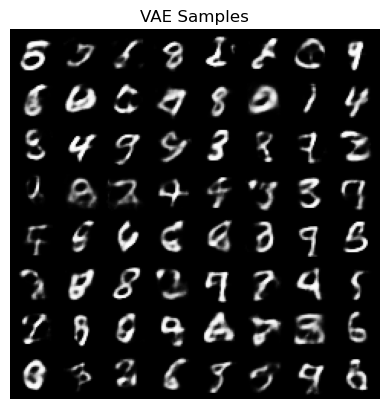

In [6]:
with torch.no_grad():

    z = torch.randn(64, 20).to(device)

    samples = vae.decode(z).view(-1, 1, 28, 28)

    grid = make_grid(samples, 8)

plt.imshow(grid.permute(1, 2, 0).cpu())
plt.title("VAE Samples")
plt.axis("off")
plt.show()


## **Part 2. DCGAN (Deep Convolutional GAN) 모델 정의 및 학습**
- Weight Initialization
  - 모델의 가중치는 평균이 0, 표준편차가 0.02인 정규분포로 초기화
  - 기존 GAN의 학습 불안정성을 줄이기 위해 DCGAN 논문에서 제안한 아이디어

- Generator (생성자)
  - Transposed Convolution: 저차원의 잠재 벡터를 고해상도 이미지로 확장
  - Batch Normalization: 각 layer의 출력을 정규화하여 학습의 안정성을 높이고 gradient vanishing 문제를 해결
  - Activation: 중간 layer에는 ReLU를 통해 빠른 학습을 진행하고, 마지막 layer에는 이미지의 픽셀 값 범위([-1, 1])를 맞추기 위해 Tanh를 사용

- Discriminator (판별자)
  - Strided Convolution: pooling 대신 stride를 사용하여 특징을 추출
  - 마지막 layer에서 sigmoid를 통해 Real/Fake 확률값 출력


참고 코드: https://github.com/Natsu6767/DCGAN-PyTorch/blob/master/dcgan.py

In [7]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))  # [-1, 1]
])

dataset = torchvision.datasets.MNIST(
    root='./data',
    train=True,
    download=True,
    transform=transform
)

# train / val split
train_size = int(0.9 * len(dataset))
val_size = len(dataset) - train_size

train_dataset, val_dataset = torch.utils.data.random_split(
    dataset,
    [train_size, val_size]
)

train_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True
)


In [8]:
# weight 초기화 함수

def weights_init(m):

    classname = m.__class__.__name__

    if classname.find("Conv") != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)

    elif classname.find("BatchNorm") != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


In [9]:
latent_size = 20

class Generator(nn.Module):

    def __init__(self):
        super().__init__()

        self.tconv1 = nn.ConvTranspose2d(latent_size, 256, 7, 1, 0, bias=False)
        self.bn1 = nn.BatchNorm2d(256)

        self.tconv2 = nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False)
        self.bn2 = nn.BatchNorm2d(128)

        self.tconv3 = nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False)
        self.bn3 = nn.BatchNorm2d(64)

        self.tconv4 = nn.ConvTranspose2d(64, 1, 3, 1, 1, bias=False)

    def forward(self, z):
        x = F.relu(self.bn1(self.tconv1(z)))   # 🤔 빈칸을 채워주세요 (Generator의 입력)
        x = F.relu(self.bn2(self.tconv2(x)))
        x = F.relu(self.bn3(self.tconv3(x)))
        x = torch.tanh(self.tconv4(x))   # 🤔 빈칸을 채워주세요 (마지막 layer 통과)
        return x


**✍️ 위에서 채운 `Generator.forward` 코드가 어떤 기능을 하고, 코드적으로 어떻게 구성되어 있는지 간단히 설명해주세요.**

*generator.ford의 코드는 랜덤 노이즈 벡터를 받아서 실제 이미지 처럼 보이는 가짜 이미지를 생성하는 역할을 한다. 코드상으로 보면, 점점 해상도를 키우고 채널 수를 줄여나가고 있다. 각 layer마다 batchNorm을 출력을 정규화해서 학습을 안정화하고 RELU를 통해 비선형성을 넣어주며 마지막 layer에서는 tanh만 적용해서 출력의 범위를 (-1,1) 범위로 맞춰준다.

In [10]:
class Discriminator(nn.Module):

    def __init__(self):
        super().__init__()

        self.conv1 = nn.Conv2d(in_channels=1, out_channels=64, kernel_size=4, stride=2, padding=1, bias=False)

        self.conv2 = nn.Conv2d(64, 128, 4, 2, 1, bias=False)
        self.bn2 = nn.BatchNorm2d(128)

        self.conv3 = nn.Conv2d(128, 256, 4, 2, 1, bias=False)
        self.bn3 = nn.BatchNorm2d(256)

        self.conv4 = nn.Conv2d(256, 1, 3, 1, 0, bias=False)

    def forward(self, x):

        x = F.leaky_relu(self.conv1(x), 0.2)
        x = F.leaky_relu(self.bn2(self.conv2(x)), 0.2)
        x = F.leaky_relu(self.bn3(self.conv3(x)), 0.2)   # 🤔 빈칸을 채워주세요 (conv3 + bn3 통과)
        x = torch.sigmoid(self.conv4(x))

        return x.view(-1, 1).squeeze(1)


**✍️ 위에서 채운 `Discriminator.forward` 코드가 어떤 기능을 하고, 코드적으로 어떻게 구성되어 있는지 간단히 설명해주세요.**

* Discriminator은 진짜인지 가짜인지 골라내는 역할을 한다. 여기에서 Discriminator에서는 코드적으로 보면 각 layer마다 convolution 연산을 거친 뒤 leaky_relu를 통과시켜 활성화한다. 이때, layer 2,3,에서만 batch normalization을 추가적으로 적용하고, layer 1에는 적용하지 않는다. 마지막 layer에서는 convolution 결과를 sigmoid에 통과시켜 0과 1 사이의 확률로 변환한 뒤, view와 squeeze를 이용해서 형태를 정리한다. 

In [11]:
G = Generator().to(device)
D = Discriminator().to(device)

G.apply(weights_init)
D.apply(weights_init)

criterion = nn.BCELoss()

optG = optim.Adam(G.parameters(), 0.0002, betas=(0.5, 0.999))
optD = optim.Adam(D.parameters(), 0.0002, betas=(0.5, 0.999))


In [12]:
for epoch in range(epochs):

    G.train()
    D.train()

    train_lossD = 0
    train_lossG = 0

    for x, _ in train_loader:

        x = x.to(device)

        real = torch.ones(x.size(0)).to(device)
        fake = torch.zeros(x.size(0)).to(device)

        # ========== Train Discriminator ==========

        z = torch.randn(x.size(0), latent_size, 1, 1).to(device)

        fake_img = G(z)

        loss_real = criterion(D(x), real)
        loss_fake = criterion(D(fake_img.detach()), fake)

        lossD = loss_real + loss_fake

        optD.zero_grad()
        lossD.backward()
        optD.step()

        # ========== Train Generator ==========

        loss_G = criterion(D(fake_img), real)  # 🤔 빈칸을 채워주세요 (Generator는 D가 fake_img를 무엇으로 착각하길 원할까요?)

        optG.zero_grad()
        loss_G.backward()
        optG.step()

        train_lossD += lossD.item()
        train_lossG += loss_G.item()

    train_lossD /= len(train_loader)
    train_lossG /= len(train_loader)

    print(f"Epoch [{epoch+1}/{epochs}] Loss D: {train_lossD:.4f} | Loss G: {train_lossG:.4f}")


Epoch [1/15] Loss D: 0.8333 | Loss G: 1.6730
Epoch [2/15] Loss D: 0.9268 | Loss G: 1.4139
Epoch [3/15] Loss D: 1.0238 | Loss G: 1.2899
Epoch [4/15] Loss D: 1.0307 | Loss G: 1.2818
Epoch [5/15] Loss D: 1.0283 | Loss G: 1.3106
Epoch [6/15] Loss D: 1.0195 | Loss G: 1.3375
Epoch [7/15] Loss D: 1.0211 | Loss G: 1.3440
Epoch [8/15] Loss D: 1.0006 | Loss G: 1.3725
Epoch [9/15] Loss D: 1.0065 | Loss G: 1.3828
Epoch [10/15] Loss D: 0.9899 | Loss G: 1.4052
Epoch [11/15] Loss D: 0.9747 | Loss G: 1.4442
Epoch [12/15] Loss D: 0.9683 | Loss G: 1.4474
Epoch [13/15] Loss D: 0.9545 | Loss G: 1.4900
Epoch [14/15] Loss D: 0.9261 | Loss G: 1.5343
Epoch [15/15] Loss D: 0.9365 | Loss G: 1.5365


**✍️ 위에서 채운  코드가 어떤 기능을 하고, 코드적으로 어떻게 구성되어 있는지 간단히 설명해주세요.**

* 코드는 Discriminator과 Generator를 번갈아 학습시키면서, 점점 진짜 같은 이미지를 만들어내도록 하는 훈련 코드이다. 코드에서는 먼저 real과 fake라벨을 만들어둔다. Discriminator를 학습하는 부분에서는, loss_real은 실제 이미지 x를 D에 넣었을 때의 출력과 real 라벨 사이의 차이를 계산하고, loss_fake는 Generator가 만든 가짜 이미지를 D에 넣었을 때의 출력과 fake 라벨 사이의 차이를 계산한다. D가 진짜는 진짜로, 가짜는 가짜로 잘 구분하는지를 각각 loss로 측정하는 것이다. 이 둘을 더한 lossD로 역전파와 업데이트를 진행해 Discriminator만 학습시킨다.

Generator를 학습하는 부분에서는, 같은 가짜 이미지 fake_img를 다시 D에 넣지만 정답 라벨에 real로 놓고 loss를 계산한다. 이는 Generator의 목표가 "D가 가짜 이미지를 진짜로 착각하게 만드는 것"이기 때문이다. 이 loss_G로 역전파와 업데이트를 진행해 Generator만 학습시킨다.


**DCGAN Sampling 시각화**

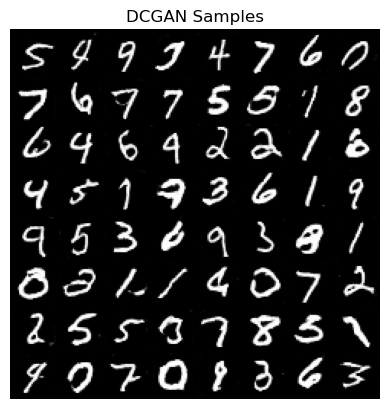

In [13]:
G.eval()

with torch.no_grad():

    z = torch.randn(64, latent_size, 1, 1).to(device)

    samples = G(z)

grid = make_grid(samples, 8, normalize=True)

plt.imshow(grid.permute(1, 2, 0).cpu())
plt.title("DCGAN Samples")
plt.axis("off")
plt.show()


## **🙋 [GAN] Question 1**
VAE와 DCGAN으로 MNIST 이미지를 생성한 결과 VAE는 흐릿한 이미지, DCGAN은 선명한 이미지가 생성된 것을 알 수 있습니다. 그 이유를 VAE와 GAN의 특징과 학습 방식을 포함하여 설명해주세요.

* 내가 생각한 이유는 VAE의 경우는 입력 이미지를 encoder로 아북해 latent space의 확률분포로 표현한 뒤에, 여기에서 sampling한 값을 decoder에 통과하여 이미지를 복원한다. VAE는 reconstruction loss를 최소화하는 방향으로 이루어지기 때문에, 여러가지 정답들의 평균에 가까운 값을 예측하는게 loss를 낮춰서 다음과 같이 흐릿한 이미지가 생성한다. 반면, DCGAN의 경우에는 Discriminator과 Generator이 서로 경쟁을 하면서 학습을한다. Discriminator은 진짜인지 가짜인지 편별하도록 학습하며, Generator은 Discriminator을 속이기 위해서 실제 데이터 분포에 가깝게 만들어내다보니까 진짜와 가짜인지 구별이 안될만큼의 이미지를 생성하여서 다음과 같이 선명한 이미지가 생성된다는 것을 알 수 있다.


## **🙋 [GAN] Question 2**
GAN 학습 과정에서 Generator와 Discriminator 중 한쪽이 너무 빨리 강해지면 어떤 문제가 발생할 수 있는지, Mode collapse 또는 Vanishing gradient 개념을 활용하여 설명해주세요.

* 만약에 GAN 학습과정에서 한쪽이 너무 강해지면 두 모델의 균형이 어려워진다. 먼저 Discriminator이 너무 강해지면, Generator이 생성한 이미지가 출력이 가짜라고 확신하여서, G가 개선할 방법이 없어 학습이 정체되어서 vanishing gradient 문제가 발생한다. 반면 Generator이 너무 강해지면, mode collapse 문제가 발생한다. D가 강하지 않다면 G가 D를 속이는 패턴을 찾는다면, 그럴듯한 이미지만 반복해서 생성하는 현상이 나타난다.

## **Part 3. Diffusion Model (DDPM) 원리 구현**

- **Forward process**: 원본 이미지 $x_0$에 $t$번에 걸쳐 점진적으로 Gaussian noise를 주입하여 $x_t$를 만드는 과정. Closed-form으로 한 번에 임의의 t 시점 노이즈 이미지를 계산할 수 있음
  $$x_t = \sqrt{\bar{\alpha}_t}\, x_0 + \sqrt{1-\bar{\alpha}_t}\, \epsilon,\quad \epsilon \sim \mathcal{N}(0, I)$$

- **Reverse process**: 노이즈 $x_t$로부터 노이즈 $\epsilon$을 예측하는 신경망(주로 U-Net)을 학습시켜, $x_T$(순수 노이즈)부터 $x_0$까지 역으로 복원

- **손실함수의 단순화**: DDPM 논문의 핵심 기여 중 하나로, 복잡한 분포 비교 대신 신경망이 예측한 노이즈와 실제 주입된 노이즈 사이의 단순 MSE Loss만으로 학습이 가능함
  $$L_{simple} = \mathbb{E}_{t, x_0, \epsilon}\left[\, \| \epsilon - \epsilon_\theta(x_t, t) \|^2 \,\right]$$

이번 파트에서는 **forward process와 손실함수, 노이즈 예측 네트워크의 핵심 구조를 직접 코드로 구현**하며 원리를 이해합니다. 다만 DDPM은 실제로는 대규모 U-Net을 오랜 시간 학습해야 제대로 된 이미지가 나오기 때문에, 짧은 실습 환경(Colab)에서 처음부터 학습시키기엔 한계가 있습니다. 그래서 우리가 구현한 것과 동일한 원리로 학습된 **Hugging Face의 사전학습 MNIST DDPM 모델**을 불러와 실제 reverse process 결과를 확인해봅니다.


In [14]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))  # [-1, 1]
])

dataset = torchvision.datasets.MNIST(
    root='./data',
    train=True,
    download=True,
    transform=transform
)

train_loader = torch.utils.data.DataLoader(
    dataset,
    batch_size=128,
    shuffle=True
)


### **Noise Schedule 정의**
$\beta_t$를 선형으로 증가시키며, $\alpha_t = 1-\beta_t$, $\bar{\alpha}_t = \prod_{s=1}^{t}\alpha_s$ 를 미리 계산해둡니다.


In [15]:
T = 1000  # DDPM 논문 기준 총 diffusion step 수

beta_start = 1e-4
beta_end = 0.02

betas = torch.linspace(beta_start, beta_end, T).to(device)
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, dim=0)

sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)


def forward_diffusion(x0, t):
    """x0(원본 이미지)에 timestep t만큼의 노이즈를 주입해 x_t를 반환"""
    noise = torch.randn_like(x0)

    sqrt_ac = sqrt_alphas_cumprod[t].view(-1, 1, 1, 1)
    sqrt_omac = sqrt_one_minus_alphas_cumprod[t].view(-1, 1, 1, 1)

    x_t = sqrt_ac * x0 + sqrt_omac * noise   # 🤔 빈칸을 채워주세요 (forward process 수식)

    return x_t, noise


**✍️ 위에서 채운 `forward_diffusion` 코드가 어떤 기능을 하고, 코드적으로 어떻게 구성되어 있는지 간단히 설명해주세요.**

* forward_diffusion은 원본이미지에 t만큼의 노이즈를 주입해서 x_t를 반환하는 기능을 한다. 그래서 코드상에서 보면 먼저 randn_like를 이용해서 노이즈를 만들고 그 이후에 sqrt_ac은 원본 이미지를 얼마나 남길지를 나타내는 계수이고, sqrt_omac은 노이즈를 얼마나 섞을지를 나타내는 계수이다. 그래서 이를 이용해서 x_t를 만들도록 구성되어 있다.


**Forward process 시각화**: t가 커질수록 이미지가 점점 순수 노이즈에 가까워지는 것을 확인해봅시다.

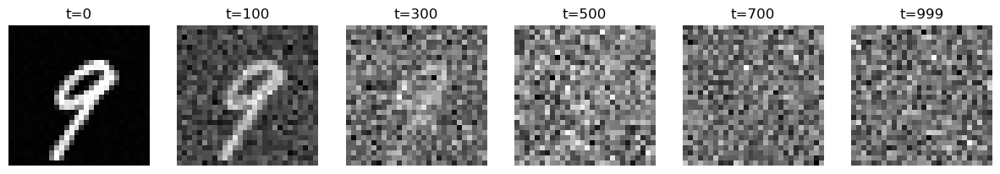

In [16]:
x0, _ = next(iter(train_loader))
x0 = x0[:1].to(device)

timesteps_to_show = [0, 100, 300, 500, 700, 999]
fig, axes = plt.subplots(1, len(timesteps_to_show), figsize=(15, 3))

for i, t_val in enumerate(timesteps_to_show):
    t = torch.tensor([t_val]).to(device)
    x_t, _ = forward_diffusion(x0, t)
    axes[i].imshow(x_t[0, 0].cpu().numpy(), cmap="gray")
    axes[i].set_title(f"t={t_val}")
    axes[i].axis("off")

plt.show()


### **U-Net 기반 노이즈 예측 네트워크**
DDPM은 노이즈가 섞인 이미지 $x_t$와 timestep $t$를 입력받아 주입된 노이즈 $\epsilon$을 예측하는 신경망을 사용합니다. 아래는 skip connection을 포함한 축소된 U-Net 구조입니다. Downsampling에서 저장해둔 feature map을 Upsampling 단계에서 다시 이어붙여(concat), 공간 정보 손실을 줄이는 것이 핵심입니다.


In [17]:
class TimeEmbedding(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, t):
        half_dim = self.dim // 2
        emb = np.log(10000) / (half_dim - 1)
        emb = torch.exp(torch.arange(half_dim, device=t.device) * -emb)
        emb = t[:, None].float() * emb[None, :]
        emb = torch.cat([torch.sin(emb), torch.cos(emb)], dim=-1)
        return emb


class SimpleUNet(nn.Module):

    def __init__(self, time_dim=64):
        super().__init__()

        self.time_mlp = nn.Sequential(
            TimeEmbedding(time_dim),
            nn.Linear(time_dim, time_dim),
            nn.ReLU()
        )

        # Downsampling
        self.down1 = nn.Conv2d(1, 64, 3, padding=1)                    # 28 -> 28
        self.down2 = nn.Conv2d(64, 128, 3, stride=2, padding=1)        # 28 -> 14
        self.down3 = nn.Conv2d(128, 256, 3, stride=2, padding=1)       # 14 -> 7

        self.time_proj = nn.Linear(time_dim, 256)

        # Bottleneck
        self.bottleneck = nn.Conv2d(256, 256, 3, padding=1)            # 7 -> 7

        # Upsampling (skip connection으로 채널이 2배가 됨)
        self.up1 = nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1)   # 7 -> 14
        self.up_conv1 = nn.Conv2d(128 + 128, 128, 3, padding=1)           # skip(h2) concat

        self.up2 = nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1)    # 14 -> 28
        self.up_conv2 = nn.Conv2d(64 + 64, 64, 3, padding=1)              # skip(h1) concat

        self.out = nn.Conv2d(64, 1, 3, padding=1)

    def forward(self, x, t):
        t_emb = self.time_mlp(t)

        # Downsampling (skip connection용으로 각 단계 출력을 저장)
        h1 = F.relu(self.down1(x))      # (B, 64, 28, 28)
        h2 = F.relu(self.down2(h1))     # (B, 128, 14, 14)
        h3 = F.relu(self.down3(h2))     # (B, 256, 7, 7)

        # timestep embedding을 bottleneck 채널에 더해줌
        t_proj = self.time_proj(t_emb).unsqueeze(-1).unsqueeze(-1)
        h3 = h3 + t_proj   # 🤔 빈칸을 채워주세요 (h3에 timestep 정보를 더해주려면?)

        h3 = F.relu(self.bottleneck(h3))

        # Upsampling + skip connection (concat)
        u1 = F.relu(self.up1(h3))                      # (B, 128, 14, 14)
        u1 = torch.cat([u1, h2], dim=1)                 # (B, 256, 14, 14)
        u1 = F.relu(self.up_conv1(u1))                  # (B, 128, 14, 14)

        u2 = F.relu(self.up2(u1))                       # (B, 64, 28, 28)
        u2 = torch.cat([u2, h1], dim=1)                  # (B, 128, 28, 28)
        u2 = F.relu(self.up_conv2(u2))                   # (B, 64, 28, 28)

        out = self.out(u2)

        return out


**✍️ 위에서 채운 `SimpleUNet.forward`의 timestep 결합 코드가 어떤 기능을 하고, 코드적으로 어떻게 구성되어 있는지 간단히 설명해주세요.**

* SimpleUNet.forward와 timestep가 결합한 코드는 이미지를 압축했다가 복원하면서, 압축 중 손실된 정보는 skip connection으로 보충하고, timestep 정보는 가장 압축된 지점에 더해줘서 지금 몇번째 단계인지를 반영한 노이즈 예측을 하는 신경망이다. 


### **DDPM Loss**
예측한 노이즈와 실제 주입한 노이즈 사이의 MSE Loss입니다.


In [18]:
def ddpm_loss(model, x0):
    B = x0.size(0)

    t = torch.randint(0, T, (B,), device=device).long()

    x_t, noise = forward_diffusion(x0, t)

    predicted_noise = model(x_t, t)

    loss = F.mse_loss(noise, predicted_noise)   # 🤔 빈칸을 채워주세요 (실제 노이즈 vs 예측 노이즈)

    return loss


**✍️ 위에서 채운 `ddpm_loss` 코드가 어떤 기능을 하고, 코드적으로 어떻게 구성되어 있는지 간단히 설명해주세요.**

* ddpm_loss 함수는 배치마다 랜덤한 timestep t를 뽑아 forward_diffusion으로 원본 이미지에 노이즈를 주입한 x_t와 실제 노이즈 noise를 만들고, 이를 모델에 입력해 예측한 predicted_noise를 얻은 뒤, 실제 노이즈와 예측 노이즈 사이의 차이를 F.mse_loss로 계산해 반환하는 함수이다. 즉 모델이 노이즈를 얼마나 정확히 맞히는지를 MSE loss로 측정한다.


## **🙋 [Diffusion] Question 1**
DDPM은 왜 원본 이미지 $x_0$를 직접 예측하지 않고, 이미지에 주입된 노이즈 $\epsilon$을 예측하도록 학습할까요?

* 노이즈르 예측하는 것이 더 쉽기 때문이다. 왜냐하면, 원본 이미지를 예측하려면, 데이터마다 다양하게 나타날 수 있어서 여기에서 epsilon은 가우시안 분포를 따르기 때문에, 이걸 예측하는 문제가 원본 이미지를 직접 복원하는 것보다 훨씬 쉽고 안정적이기 때문이다.


In [19]:
unet = SimpleUNet().to(device)

# 참고: 위에서 구현한 forward_diffusion / SimpleUNet / ddpm_loss가
# DDPM 학습의 핵심 원리 전부입니다. 다만 실제로 눈에 보이는 숫자 이미지를
# 생성할 수준까지 학습시키려면 훨씬 더 큰 모델과 긴 학습 시간이 필요합니다.
# 아래에서는 동일한 원리로 이미 충분히 학습된 사전학습 모델을 불러와
# reverse process 결과를 직접 확인해봅니다.


### **사전학습된 DDPM으로 Reverse Process 결과 확인**

Hugging Face에는 우리가 위에서 구현한 것과 동일한 원리(forward process, 노이즈 예측 U-Net, MSE loss)로 MNIST를 학습시킨 DDPM 모델이 공개되어 있습니다. `DDPMPipeline`을 불러와 실제 reverse process가 어떻게 노이즈에서 숫자 이미지를 만들어내는지 확인해봅시다.


In [20]:
!pip install -q diffusers transformers accelerate safetensors

/opt/anaconda3/envs/terminator/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Loading pipeline components...: 100%|██████████| 2/2 [00:00<00:00, 22.99it/s]


FrozenDict([('num_train_timesteps', 1000), ('beta_start', 0.0001), ('beta_end', 0.02), ('beta_schedule', 'squaredcos_cap_v2'), ('trained_betas', None), ('variance_type', 'fixed_small'), ('clip_sample', True), ('prediction_type', 'epsilon'), ('thresholding', False), ('dynamic_thresholding_ratio', 0.995), ('clip_sample_range', 1.0), ('sample_max_value', 1.0), ('timestep_spacing', 'leading'), ('steps_offset', 0), ('rescale_betas_zero_snr', False), ('_class_name', 'DDPMScheduler'), ('_diffusers_version', '0.27.2')])


100%|██████████| 200/200 [00:24<00:00,  8.27it/s]


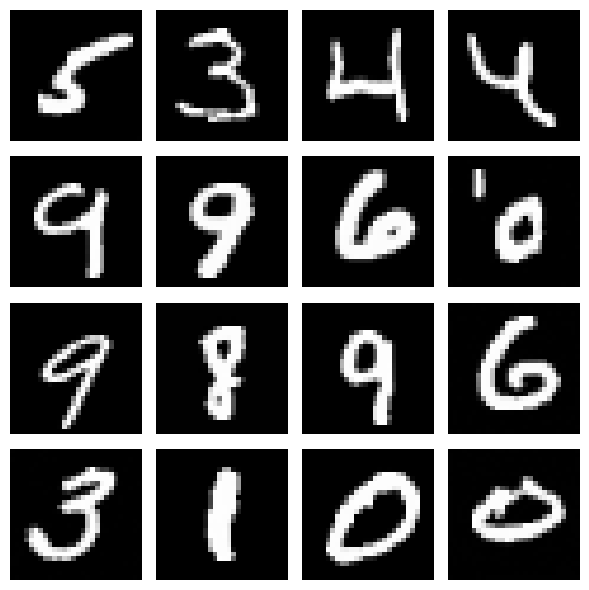

In [21]:
import torch
import matplotlib.pyplot as plt
from diffusers import DDPMPipeline

device = "cuda" if torch.cuda.is_available() else "cpu"

pipe = DDPMPipeline.from_pretrained(
    "nathanReitinger/MNIST-diffusion"
).to(device)

# Scheduler 설정 확인
print(pipe.scheduler.config)

# Reverse process
images = pipe(
    batch_size=16,
    num_inference_steps=200
).images

# 결과 확인
fig, axes = plt.subplots(4, 4, figsize=(6, 6))

for ax, image in zip(axes.flatten(), images):
    ax.imshow(image, cmap="gray")
    ax.axis("off")

plt.tight_layout()
plt.show()

### 별도 question!
결과가 이상하게 나와서 당황하셨죠?
왜 ddpm은 앞의 vae와 gan과 다르게 일관적이지 않고 어떤건 바르게 어떤 건 완전 악필이 쓴 것처럼 나오는 걸까요?

- DDPM에서 복원된 이미지가 매번 다른 이유는 입력 이미지를 그대로 재구성하는 것이 아니라, 이미지를 완전히 노이즈로 만든 뒤 역과정의 매 스텝마다 확률적으로 노이즈를 샘플링하여 새로운 이미지를 생성하는 확률적 모델이기 때문이다. 모델은 픽셀 값을 직접 복원하는 대신 각 시점의 노이즈를 예측해 확률 분포로부터 표본을 추출하는 방식으로 작동하므로, 매 실행 시 무작위 샘플링에 의해 서로 다른 결과물이 만들어진다.

## **🙋 [Diffusion] Question 2**
VAE, GAN, Diffusion 세 모델을 **학습 안정성**, **생성 품질**, **추론(샘플링) 속도** 세 가지 관점에서 비교해주세요.

앞선 실습 사진을 보고 하는 것이 아닌 이론적으로 비교해주시면 됩니다.아무래도 실습이다보니 이 결과로 비교하는 것은 이론적으로 틀릴 수도 있어서...


- VAE는 잠재공간을 가정하고, Reconstruction Loss와 KL Divergence를 최적화하는 loss function을 가지며 학습은 안정적으로 이루어진다. 하지만, 생성 이미지가 흐릿한 경향이 있으며 추론 속도도 매우 빠르다. GAN은 Discriminator과 Generator이 경쟁하면서 학습을 진행하여 학습 안전성은 매우 불안정하지만, 매우 선명한 이미지를 생산할 수 있으며 추론 속도도 매우 빠르다. Diffusion은 데이터에 노이즈를 더하고 다시 제거하는 과정을 학습하다 보니 학습은 상대적으로 안정적으로 이루어지고, 좋은 품질의 이미지를 생산할 수 있지만, 수십~수백번 스텝은 반복하다 보니까 추론 속도가 느리다.


## **Part 4. Hugging Face `diffusers`로 사전학습 Diffusion 모델 실습**

Part 3에서 우리는 DDPM의 핵심 원리(forward process, 노이즈 예측 U-Net, MSE loss)를 직접 코드로 구현하고, MNIST 전용 사전학습 모델로 그 결과를 확인해봤습니다. 이번에는 훨씬 크고 복잡한 U-Net을 방대한 이미지-텍스트 데이터로 학습시킨 모델을 다뤄봅니다. 대표적으로 **Stable Diffusion**은 발표자료에서 다룬 것처럼 VAE + Diffusion(Latent Diffusion) + Cross-Attention 기반 Text Conditioning 구조를 가지고 있습니다.

Hugging Face의 `diffusers` 라이브러리를 사용하면 이런 사전학습 모델을 몇 줄의 코드로 불러와 사용할 수 있습니다. Colab에서는 **런타임 유형을 GPU로 설정**한 후 진행해주세요. (런타임 → 런타임 유형 변경 → T4 GPU)


In [22]:
!pip install -q diffusers transformers accelerate


### **4-1. Text-to-Image: Stable Diffusion**

프롬프트를 입력하면 그에 맞는 이미지를 생성해주는 `StableDiffusionPipeline`을 사용해봅니다. 내부적으로는 텍스트 프롬프트를 CLIP text encoder로 임베딩하고, 이를 조건으로 latent space에서 diffusion(denoising)을 수행한 뒤, VAE decoder로 pixel space 이미지를 복원합니다. (발표자료 33p의 Stable Diffusion 구조 참고)


In [23]:
import torch
from diffusers import StableDiffusionPipeline

model_id = "runwayml/stable-diffusion-v1-5"

pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16
)
pipe = pipe.to("mps")


/opt/anaconda3/envs/terminator/lib/python3.11/site-packages/diffusers/utils/deprecation_utils.py:23: FutureWarning: `torch_dtype` is deprecated and will be removed in version 1.0.0. Please use `dtype` instead.
  deprecate("torch_dtype", "1.0.0", _TORCH_DTYPE_DEPRECATION_MESSAGE)
Loading pipeline components...: 100%|██████████| 7/7 [00:00<00:00, 11.60it/s]


100%|██████████| 35/35 [00:17<00:00,  1.95it/s]


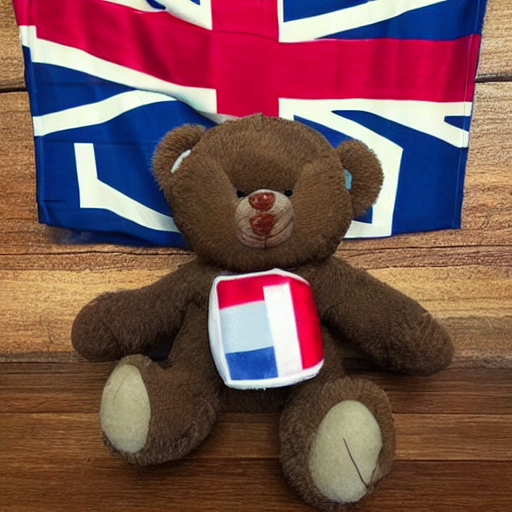

In [33]:
prompt = "A teddy bear featuring the British flag on its belly."   # 🤔 원하는 프롬프트로 자유롭게 바꿔보세요

image = pipe(
    prompt,
    num_inference_steps=35,   # 🤔 빈칸을 채워주세요 (몇 step 만에 denoising을 마칠지, 예: 25~50)
    guidance_scale=7.5
).images[0]

image


**✍️ 위에서 채운 `num_inference_steps` 코드가 어떤 기능을 하고, 이 값이 커지거나 작아지면 결과가 어떻게 달라지는지 간단히 설명해주세요.**

* num_inference_step은 denoising step의 횟수를 정한다. 만약에 이 값이 커진다면 더 높은 퀄리티의 이미지를 만들 수 있지만 속도는 느릴것이다. 반대로 만약에 이 값이 작다면 상대적으로 낮은 퀄리티의 이미지를 만들지만, 속도는 횟수가 많은 것에 비해서 빠를것이다.


## **🙋 [Hugging Face] Question 1**
위 코드의 `guidance_scale` 파라미터는 발표자료의 **Classifier-free guidance(CFG)** 개념과 관련이 있습니다. `guidance_scale` 값을 낮추거나(예: 1.0) 높이면(예: 15.0) 생성 결과가 각각 어떻게 달라질지 예상해보고, 실제로 두 값으로 각각 이미지를 생성해 비교해주세요.

* guidance_scale의 값을 높일 경우에는 모델이 텍스트 프롬포트와 더 밀접하게 연관된 이미지를 생성하도록 유도하지만, 이미지의 품질이 낮아질 수 있다. 반대로 guidance_scale의 값이 낮을 경우에는 프롬포트를 거의 무시하여서 프롬포트와 무관한 이미지가 나올 확률이 있다.


100%|██████████| 30/30 [00:15<00:00,  1.94it/s]


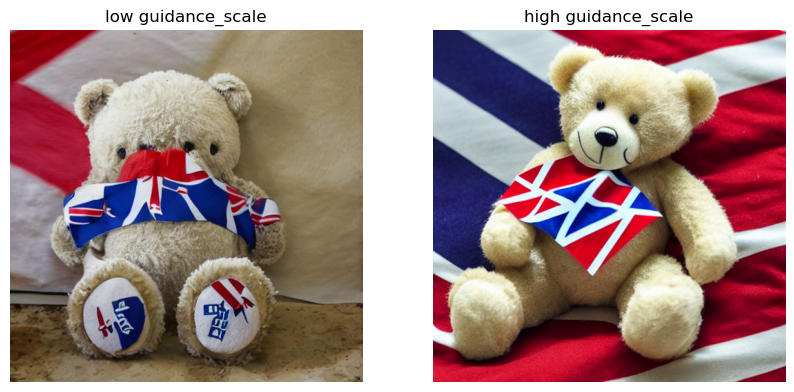

In [34]:
# 🤔 guidance_scale을 다르게 주어 두 이미지를 생성하고 비교해주세요
prompt = "A teddy bear featuring the British flag on its belly."

image_low_cfg = pipe(prompt, num_inference_steps=30, guidance_scale=3).images[0]   # 🤔 빈칸을 채워주세요
image_high_cfg = pipe(prompt, num_inference_steps=30, guidance_scale=10).images[0]  # 🤔 빈칸을 채워주세요

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(image_low_cfg)
axes[0].set_title("low guidance_scale")
axes[0].axis("off")
axes[1].imshow(image_high_cfg)
axes[1].set_title("high guidance_scale")
axes[1].axis("off")
plt.show()


**✍️ 위에서 채운 `guidance_scale` 비교 코드가 어떤 기능을 하고, 코드적으로 어떻게 구성되어 있는지 간단히 설명해주세요.**

* guidance_scale 비교 코드는 결국 모델이 프롬포트가 하는 말을 얼마나 반영할지 조절하는 파라미터 기능을 하며 위는 그것을 시각화해주는 역할을 한다. 위 코드를 보면 low guidance_scale과 high guidance_scale 이미지를 생성하고 그것을 plt.plot을 이용해서 시각화하는 코드가 있다.


### **4-2. Sampler(Scheduler) 교체해보기**

발표자료 33p에서 언급했듯 Stable Diffusion은 하나로 고정된 모델이 아니라, denoising에 사용하는 sampler(scheduler)를 자유롭게 교체할 수 있는 구조입니다. 기본 스케줄러 대신 DDIM 스케줄러로 교체하여 더 적은 step으로도 이미지를 생성해봅니다.


100%|██████████| 20/20 [00:09<00:00,  2.00it/s]


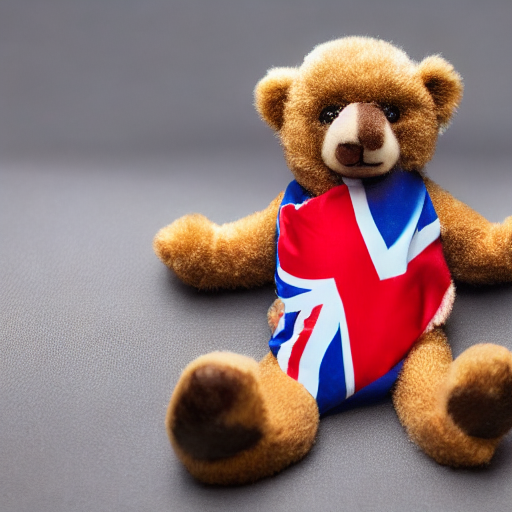

In [35]:
from diffusers import DDIMScheduler

pipe.scheduler = DDIMScheduler.from_config(pipe.scheduler.config)

image_ddim = pipe(
    prompt,
    num_inference_steps=20,  # DDPM보다 훨씬 적은 step
    guidance_scale=7.5
).images[0]

image_ddim


## **🙋 [Hugging Face] Question 2**
DDIM 스케줄러가 기본 스케줄러보다 적은 step으로도 그럴듯한 이미지를 생성할 수 있는 이유를 Part 3에서 다룬 DDPM의 reverse process와 비교하여 설명해주세요.

* DDPM은 reverse process에서 매 스텝마다 확률적으로 노이즈를 재주입하며 순차적으로 다음 상태로 이동한다. 이 때문에 중간 스텝을 건너뛰면 확률적 경로가 어긋나 오차가 누적되므로, 학습 시 정의된 스텝 수를 거의 그대로 다 거쳐야 안정적인 이미지가 나온다. 반면 DDIM은 동일한 노이즈 예측 모델을 사용하되, reverse process 과정에서 노이즈를 재주입하지 않고 원본 이미지를 직접추정하고 이로 다음 단계로 넘어가다 보니 훨씬 적은 step만으로도 그럴듯한 이미지를 생성할 수 있다.


## **🙋 [Hugging Face] Question 3**
직접 해보기 + 허깅 페이스와 인사하기

허깅페이스의 모델 api 활용하기/space에서 모델 3개 이상 활용해보기
둘 중 하나를 택해서 실행하고 간단하게 써본 경험을 공유해주세요!

[예시 노션 링크](https://app.notion.com/p/Hugging-face-3a059e60d52d80f49489f7a3c3ef6648?source=copy_link)

In [39]:
!pip install datasets

  Using cached dill-0.4.1-py3-none-any.whl.metadata (10 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 559.1/559.1 kB 14.5 MB/s  0:00:00
Using cached dill-0.4.1-py3-none-any.whl (120 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.9/35.9 MB 12.6 MB/s  0:00:02 eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13/13 [datasets]/13 [datasets]]


Evaluating: 100%|██████████| 300/300 [00:04<00:00, 64.41it/s]


Top-1 Accuracy: 98.67%
Top-5 Accuracy: 100.00%


/var/folders/45/py660m1n7w1grzhxqcysk0dc0000gp/T/ipykernel_1702/1365173119.py:96: UserWarning: Glyph 51096 (\N{HANGUL SYLLABLE JAL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/45/py660m1n7w1grzhxqcysk0dc0000gp/T/ipykernel_1702/1365173119.py:96: UserWarning: Glyph 52286 (\N{HANGUL SYLLABLE CAJ}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/45/py660m1n7w1grzhxqcysk0dc0000gp/T/ipykernel_1702/1365173119.py:96: UserWarning: Glyph 51008 (\N{HANGUL SYLLABLE EUN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/45/py660m1n7w1grzhxqcysk0dc0000gp/T/ipykernel_1702/1365173119.py:96: UserWarning: Glyph 44163 (\N{HANGUL SYLLABLE GEOS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/45/py660m1n7w1grzhxqcysk0dc0000gp/T/ipykernel_1702/1365173119.py:96: UserWarning: Glyph 50696 (\N{HANGUL SYLLABLE YE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/45/py660m1n7w1grzhxqcysk0dc0000gp/T/ipykernel_1

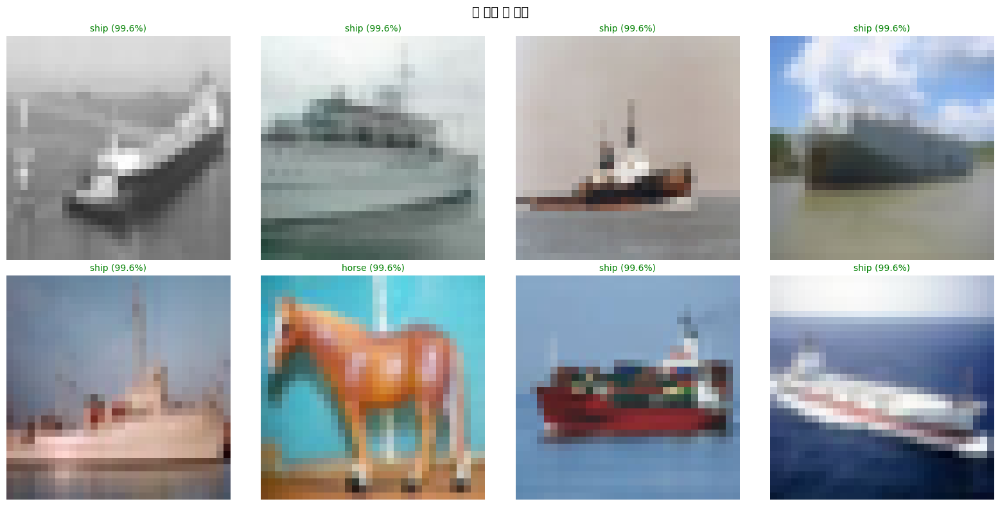

/var/folders/45/py660m1n7w1grzhxqcysk0dc0000gp/T/ipykernel_1702/1365173119.py:96: UserWarning: Glyph 49892 (\N{HANGUL SYLLABLE SIL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/45/py660m1n7w1grzhxqcysk0dc0000gp/T/ipykernel_1702/1365173119.py:96: UserWarning: Glyph 51228 (\N{HANGUL SYLLABLE JE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/45/py660m1n7w1grzhxqcysk0dc0000gp/T/ipykernel_1702/1365173119.py:96: UserWarning: Glyph 52769 (\N{HANGUL SYLLABLE CEUG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/45/py660m1n7w1grzhxqcysk0dc0000gp/T/ipykernel_1702/1365173119.py:96: UserWarning: Glyph 47803 (\N{HANGUL SYLLABLE MOS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/opt/anaconda3/envs/terminator/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 49892 (\N{HANGUL SYLLABLE SIL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/anaconda3/envs/terminato

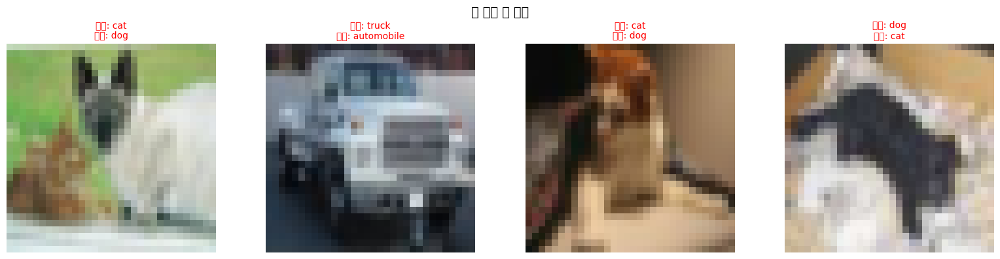

In [41]:
import torch
import matplotlib.pyplot as plt
from datasets import load_dataset
from transformers import ViTImageProcessor, ViTForImageClassification
from tqdm import tqdm

# 1. 데이터셋 & 모델 로드
ds = load_dataset("uoft-cs/cifar10")
test_ds = ds["test"]

model_name = "nateraw/vit-base-patch16-224-cifar10"
feature_extractor = ViTImageProcessor.from_pretrained(model_name)
model = ViTForImageClassification.from_pretrained(model_name)

device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
model = model.to(device)
model.eval()

classes = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

# 2. 평가할 샘플 수
num_samples = 300
subset = test_ds.select(range(num_samples))

top1_correct = 0
top5_correct = 0

correct_examples = []   # 잘 맞춘 예시 저장
wrong_examples = []     # 못 맞춘 예시 저장

# 3. 예측 반복
for sample in tqdm(subset, desc="Evaluating"):
    image = sample["img"]
    true_label = sample["label"]

    inputs = feature_extractor(images=image, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
        probs = torch.softmax(logits, dim=1)

    top5_preds = torch.topk(logits, k=5, dim=1).indices[0].tolist()
    pred_label = top5_preds[0]
    confidence = probs[0][pred_label].item()

    is_correct = (pred_label == true_label)
    if is_correct:
        top1_correct += 1
    if true_label in top5_preds:
        top5_correct += 1

    record = {
        "image": image,
        "true": classes[true_label],
        "pred": classes[pred_label],
        "confidence": confidence
    }

    if is_correct:
        correct_examples.append(record)
    else:
        wrong_examples.append(record)

# 4. Accuracy 출력
top1_acc = top1_correct / num_samples * 100
top5_acc = top5_correct / num_samples * 100
print(f"Top-1 Accuracy: {top1_acc:.2f}%")
print(f"Top-5 Accuracy: {top5_acc:.2f}%")


# 5. 시각화 함수
def plot_examples(examples, title, n=8, mode="correct"):
    n = min(n, len(examples))
    # 확신도 높은 순으로 정렬해서 보여주기 (correct는 높은 확신도, wrong도 대표적으로)
    examples_sorted = sorted(examples, key=lambda x: -x["confidence"])[:n]

    cols = 4
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))
    axes = axes.flatten()

    for i, ex in enumerate(examples_sorted):
        ax = axes[i]
        ax.imshow(ex["image"])
        ax.axis("off")
        if mode == "correct":
            ax.set_title(f"{ex['pred']} ({ex['confidence']*100:.1f}%)", fontsize=10, color="green")
        else:
            ax.set_title(f"실제: {ex['true']}\n예측: {ex['pred']}", fontsize=10, color="red")

    for j in range(len(examples_sorted), len(axes)):
        axes[j].axis("off")

    fig.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()


# 6. 잘 맞춘 예시 / 못 맞춘 예시 출력
plot_examples(correct_examples, "잘 찾은 것 예시", n=8, mode="correct")
plot_examples(wrong_examples, "못 찾은 것 예시", n=8, mode="wrong")

Evaluating: 100%|██████████| 300/300 [00:04<00:00, 62.98it/s]
/var/folders/45/py660m1n7w1grzhxqcysk0dc0000gp/T/ipykernel_1702/4252547826.py:92: UserWarning: Glyph 51096 (\N{HANGUL SYLLABLE JAL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/45/py660m1n7w1grzhxqcysk0dc0000gp/T/ipykernel_1702/4252547826.py:92: UserWarning: Glyph 52286 (\N{HANGUL SYLLABLE CAJ}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/45/py660m1n7w1grzhxqcysk0dc0000gp/T/ipykernel_1702/4252547826.py:92: UserWarning: Glyph 51008 (\N{HANGUL SYLLABLE EUN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/45/py660m1n7w1grzhxqcysk0dc0000gp/T/ipykernel_1702/4252547826.py:92: UserWarning: Glyph 44163 (\N{HANGUL SYLLABLE GEOS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/45/py660m1n7w1grzhxqcysk0dc0000gp/T/ipykernel_1702/4252547826.py:92: UserWarning: Glyph 50696 (\N{HANGUL SYLLABLE YE}) missing from font(s) DejaVu Sans.
  plt.tight_layout(

Top-1 Accuracy: 87.67%
Top-5 Accuracy: 96.33%


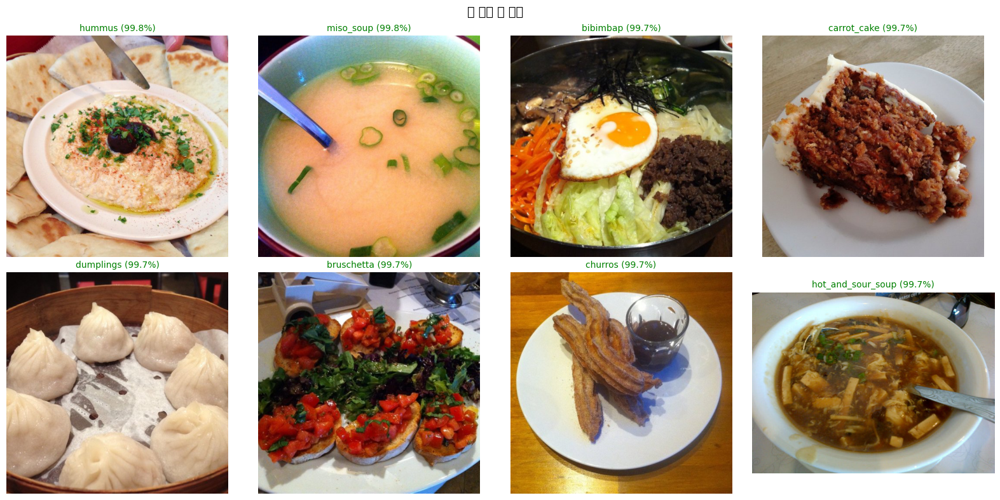

/var/folders/45/py660m1n7w1grzhxqcysk0dc0000gp/T/ipykernel_1702/4252547826.py:92: UserWarning: Glyph 49892 (\N{HANGUL SYLLABLE SIL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/45/py660m1n7w1grzhxqcysk0dc0000gp/T/ipykernel_1702/4252547826.py:92: UserWarning: Glyph 51228 (\N{HANGUL SYLLABLE JE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/45/py660m1n7w1grzhxqcysk0dc0000gp/T/ipykernel_1702/4252547826.py:92: UserWarning: Glyph 52769 (\N{HANGUL SYLLABLE CEUG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/var/folders/45/py660m1n7w1grzhxqcysk0dc0000gp/T/ipykernel_1702/4252547826.py:92: UserWarning: Glyph 47803 (\N{HANGUL SYLLABLE MOS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


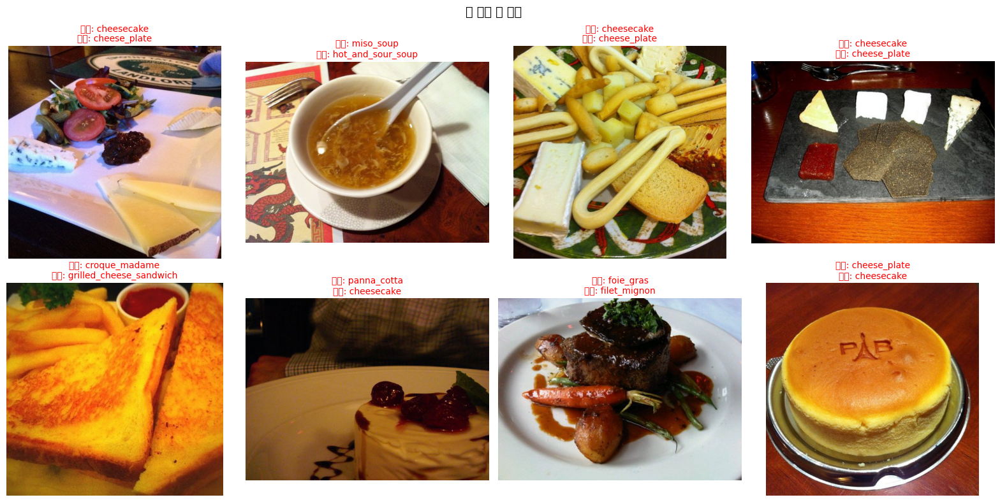

In [45]:
import torch
import matplotlib.pyplot as plt
from datasets import load_dataset
from transformers import AutoImageProcessor, AutoModelForImageClassification
from tqdm import tqdm

# 1. 데이터셋 로드
ds = load_dataset("ethz/food101")
test_ds = ds["validation"]  # food101은 train/validation으로 구성됨

# 2. 모델 로드
processor = AutoImageProcessor.from_pretrained("nateraw/food")
model = AutoModelForImageClassification.from_pretrained("nateraw/food", device_map="auto")
model.eval()

device = model.device  # device_map="auto"가 이미 적용한 디바이스를 그대로 사용

classes = model.config.id2label  # 101개 음식 라벨 매핑 (모델에 저장되어 있음)

# 3. 평가할 샘플 수
num_samples = 300
subset = test_ds.shuffle(seed=42).select(range(num_samples))

top1_correct = 0
top5_correct = 0
correct_examples = []
wrong_examples = []

# 4. 예측 반복
for sample in tqdm(subset, desc="Evaluating"):
    image = sample["image"].convert("RGB")
    true_label = sample["label"]

    inputs = processor(images=image, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
        probs = torch.softmax(logits, dim=1)

    top5_preds = torch.topk(logits, k=5, dim=1).indices[0].tolist()
    pred_label = top5_preds[0]
    confidence = probs[0][pred_label].item()

    is_correct = (pred_label == true_label)
    if is_correct:
        top1_correct += 1
    if true_label in top5_preds:
        top5_correct += 1

    record = {
        "image": image,
        "true": classes[true_label],
        "pred": classes[pred_label],
        "confidence": confidence
    }
    (correct_examples if is_correct else wrong_examples).append(record)

# 5. Accuracy 출력
top1_acc = top1_correct / num_samples * 100
top5_acc = top5_correct / num_samples * 100
print(f"Top-1 Accuracy: {top1_acc:.2f}%")
print(f"Top-5 Accuracy: {top5_acc:.2f}%")


# 6. 시각화 함수
def plot_examples(examples, title, n=8, mode="correct"):
    n = min(n, len(examples))
    if n == 0:
        print(f"{title}: 예시 없음")
        return
    examples_sorted = sorted(examples, key=lambda x: -x["confidence"])[:n]

    cols = 4
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))
    axes = axes.flatten() if n > 1 else [axes]

    for i, ex in enumerate(examples_sorted):
        ax = axes[i]
        ax.imshow(ex["image"])
        ax.axis("off")
        if mode == "correct":
            ax.set_title(f"{ex['pred']} ({ex['confidence']*100:.1f}%)", fontsize=10, color="green")
        else:
            ax.set_title(f"실제: {ex['true']}\n예측: {ex['pred']}", fontsize=10, color="red")

    for j in range(len(examples_sorted), len(axes)):
        axes[j].axis("off")

    fig.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()


# 7. 결과 시각화
plot_examples(correct_examples, "잘 찾은 것 예시", n=8, mode="correct")
plot_examples(wrong_examples, "못 찾은 것 예시", n=8, mode="wrong")

Generating test split: 100%|██████████| 5794/5794 [00:00<00:00, 33196.41 examples/s]


DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 5994
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 5794
    })
})
['image', 'label']


Loading weights: 100%|██████████| 200/200 [00:00<00:00, 51666.72it/s]


이미지 컬럼: image, 라벨 컬럼: label


Evaluating: 100%|██████████| 300/300 [00:04<00:00, 60.37it/s]


Top-1 Accuracy: 98.33%
Top-5 Accuracy: 100.00%


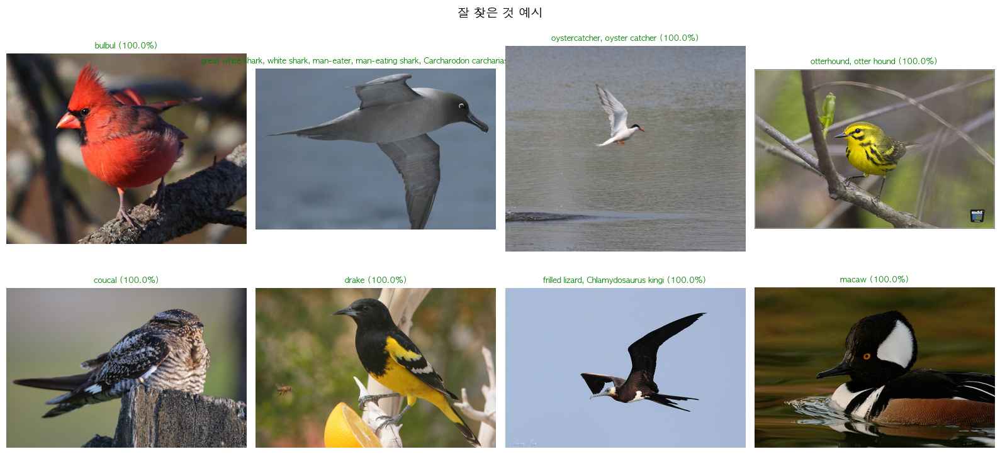

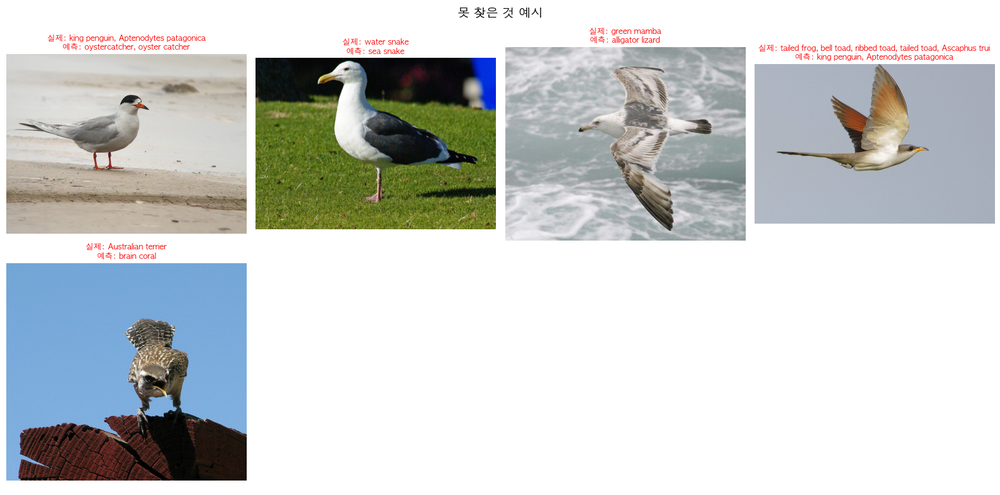

In [48]:
import torch
import matplotlib.pyplot as plt
from datasets import load_dataset
from transformers import AutoImageProcessor, AutoModelForImageClassification
from tqdm import tqdm

# 한글 폰트 설정 (본인 OS에 맞게 하나 선택)
plt.rcParams['font.family'] = 'AppleGothic'   # 맥
# plt.rcParams['font.family'] = 'Malgun Gothic'  # 윈도우
plt.rcParams['axes.unicode_minus'] = False

# 1. 데이터셋 로드
ds = load_dataset("Donghyun99/CUB-200-2011")
print(ds)
print(ds["test"].column_names)

test_ds = ds["test"]

# 2. 모델 로드
processor = AutoImageProcessor.from_pretrained("HaotianZG/vit-cub-200-2011-bird")
model = AutoModelForImageClassification.from_pretrained("HaotianZG/vit-cub-200-2011-bird", device_map="auto")
model.eval()

device = model.device  # device_map="auto"가 배치한 디바이스 그대로 사용
classes = model.config.id2label

# 3. 컬럼명 자동 감지
image_col = "image" if "image" in test_ds.column_names else "img"
label_col = "label" if "label" in test_ds.column_names else "labels"
print(f"이미지 컬럼: {image_col}, 라벨 컬럼: {label_col}")

# 4. 무작위로 300장 샘플링
num_samples = 300
subset = test_ds.shuffle(seed=42).select(range(min(num_samples, len(test_ds))))

top1_correct = 0
top5_correct = 0
correct_examples = []
wrong_examples = []

# 5. 예측 반복
for sample in tqdm(subset, desc="Evaluating"):
    image = sample[image_col].convert("RGB")
    true_label = sample[label_col]

    inputs = processor(images=image, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
        probs = torch.softmax(logits, dim=1)

    top5_preds = torch.topk(logits, k=5, dim=1).indices[0].tolist()
    pred_label = top5_preds[0]
    confidence = probs[0][pred_label].item()

    is_correct = (pred_label == true_label)
    if is_correct:
        top1_correct += 1
    if true_label in top5_preds:
        top5_correct += 1

    record = {
        "image": image,
        "true": classes.get(true_label, str(true_label)),
        "pred": classes.get(pred_label, str(pred_label)),
        "confidence": confidence
    }
    (correct_examples if is_correct else wrong_examples).append(record)

# 6. Accuracy 출력
top1_acc = top1_correct / len(subset) * 100
top5_acc = top5_correct / len(subset) * 100
print(f"Top-1 Accuracy: {top1_acc:.2f}%")
print(f"Top-5 Accuracy: {top5_acc:.2f}%")


# 7. 시각화 함수 (클래스 중복 방지 포함)
def plot_examples(examples, title, n=8, mode="correct"):
    n = min(n, len(examples))
    if n == 0:
        print(f"{title}: 예시 없음")
        return

    if mode == "correct":
        seen = set()
        picked = []
        for ex in sorted(examples, key=lambda x: -x["confidence"]):
            if ex["pred"] not in seen:
                picked.append(ex)
                seen.add(ex["pred"])
            if len(picked) >= n:
                break
        examples_sorted = picked
    else:
        examples_sorted = sorted(examples, key=lambda x: -x["confidence"])[:n]

    cols = 4
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))
    axes = axes.flatten() if n > 1 else [axes]

    for i, ex in enumerate(examples_sorted):
        ax = axes[i]
        ax.imshow(ex["image"])
        ax.axis("off")
        if mode == "correct":
            ax.set_title(f"{ex['pred']} ({ex['confidence']*100:.1f}%)", fontsize=9, color="green")
        else:
            ax.set_title(f"실제: {ex['true']}\n예측: {ex['pred']}", fontsize=9, color="red")

    for j in range(len(examples_sorted), len(axes)):
        axes[j].axis("off")

    fig.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()


# 8. 결과 시각화
plot_examples(correct_examples, "잘 찾은 것 예시", n=8, mode="correct")
plot_examples(wrong_examples, "못 찾은 것 예시", n=8, mode="wrong")


## 생성형 AI 활용 (비판적 사용)

AI는 **검산기·설명 도우미**로 활용하고 최종 판단은 본인이 합니다.

- **어디에 썼나** (PyTorch 문법 디버깅·개념 설명·에러 해석 등 구체적으로): hugging face에서 데이터와 모델을 불러와서 사용하는 부분에서 claude를 이용해서 코드를 만드는것에 도움을 받았다. 

- **AI가 이 실험에는 틀린 답을 준 사례** —
  본인이 겪은 사례와, 그것을 **어떻게 알아채고 고쳤는지**(본인 출력값과 대조 / 공식 문서 확인 / 직접 실험) 적으세요: 따로 없었던것 같습니다.

- **실제 대화 내역** 붙여넣기:

```
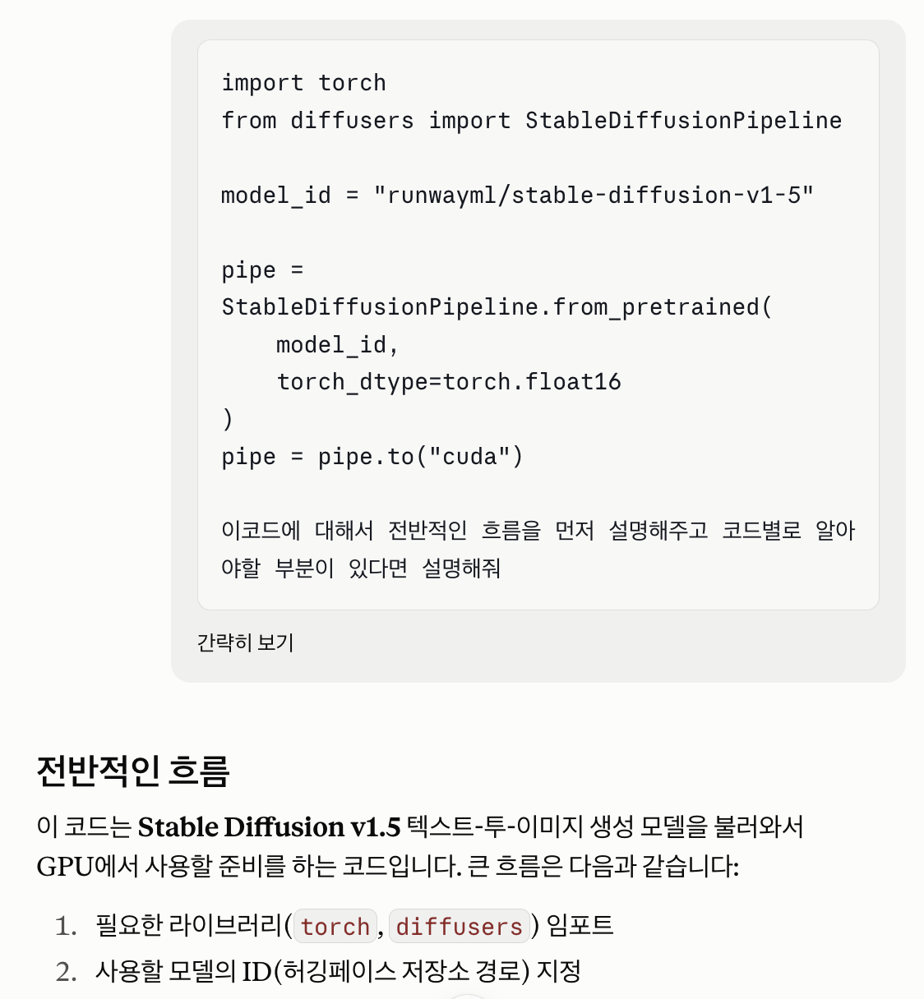

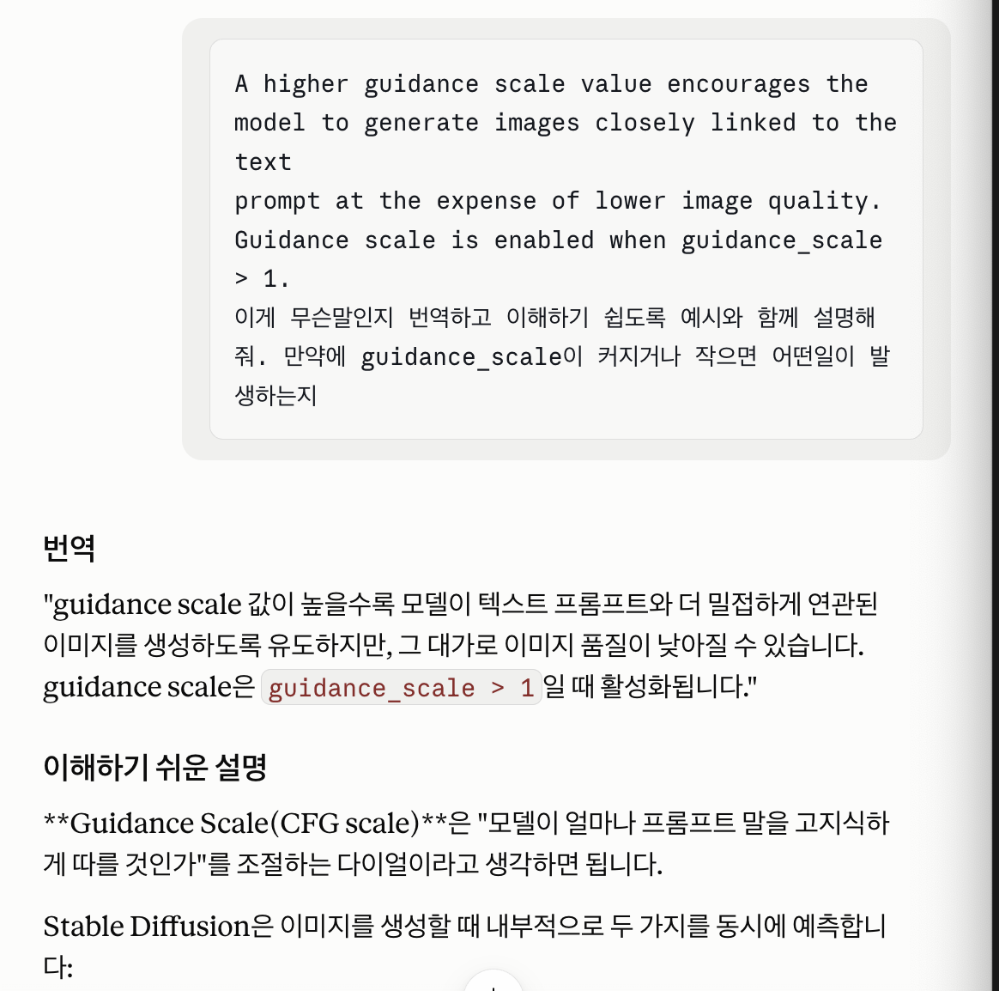
```

- 마지막 한 문장: **AI가 대신할 수 없었던 나만의 판단**은? guidance scale을 얼마로 줘야 원하는 이미지가 나오는지 감을 잡는 것도, AI 설명에서 빠진 핵심 논리를 알아채고 채우는 것도 결국 인간의 판단이었다.


수고하셨습니다 ☺️